1 Author

Student Name: Karsh Vashi

Student ID: 220655259


# 2 Problem formulation

The problem that has been intended to solve is to build a machine learning pipeline where on giving an audio file as input we predict whether the audio segment has been recorded indoors or outdoors.

# 3 Machine Learning pipeline

The machine learning pipeline consists of:

*   Loading the MLEnd London Sounds dataset
*   Feature Extraction

*   Model Training

*   Model Evaluation and checking accuracy






# 4 Transformation stage

Instead of using the raw audio file as input to our machine learning model which would have not been suitable for our rather small dataset we will extract 4 features from the signals and then use them.

Here, we have extracted 4 audio features from the raw audio files:
power
pitch - mean
pitch - standard deviation
fraction of voiced region

Note that the getXY() function takes the audio file as an input and returns these 4 predictors and a binary label of indoor/outdoor as output.

# 5 Modelling

Here, we will use the support vector machine (SVM) model for predicting the the y label using the featues stored in X. For this, we will first perform a train test split on X and y.

SVM is a supervised learning model which is used for classification tasks. It has the ability to provide very accurate predictions even for small or unbalanced datasets. So, we use this model here.

# 6 Methodology

After splitting predictors in X and binary label y into train and test datasets, we will fit the SVM model on the training dataset. Then, we will predict the y using the model for both X-training and X-validation. 

The performance of the model is assessed through the training and validation accuracy. We will calculate and display both of them.

We can also normalise the predictors and then fit the model to see if the accuracy increases.



# 7 Dataset

The dataset we are using is MLEnd London Sounds dataset.The dataset contains information of the samples collected by the students. It has five attributes:

* Audio(file_id)

* area

* Spot

* Whether indoor or outdoor (in_out)

* Participant

We will use the in_out attribute as the binary label.


In [ ]:
from google.colab import drive

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os, sys, re, pickle, glob
import urllib.request
import zipfile

import IPython.display as ipd
from tqdm import tqdm
import librosa

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Understanding our dataset sample



And now check how many audio files we have:

In [ ]:
# sample_path2 = '/content/drive/MyDrive/Data1/MLEndLS_3/*.wav'
# sample_path = '/content/drive/MyDrive/Data/MLEndLS/sample/MLEndLS_Sample/*.wav'
files=[]
# a= []
for i in range(1,6):
  sample_path = '/content/drive/MyDrive/Data1/MLEndLS_@/*.wav'.replace('@',str(i))
  files += glob.glob(sample_path)

  # print(len(files))
# files = glob.glob(sample_path)
# files = glob.glob(sample_path2)

len(files)
# type(files)

2500

In [ ]:
for _ in range(5):
  n = np.random.randint(98)
  display(ipd.Audio(files[n]))

In [ ]:
MLENDLS_df = pd.read_csv('./MLEndLS.csv').set_index('file_id') 
MLENDLS_df

,area,spot,in_out,Participant
file_id,,,,
0001.wav,british,street,outdoor,S151
0002.wav,kensington,dinosaur,indoor,S127
0003.wav,campus,square,outdoor,S18
0004.wav,kensington,hintze,indoor,S179
0005.wav,campus,square,outdoor,S176
...,...,...,...,...
2496.wav,westend,trafalgar,outdoor,S151
2497.wav,campus,square,outdoor,S6
2498.wav,westend,national,indoor,S96


In [ ]:
for file in files:
  print(file.split('/')[-1])

0041.wav
0044.wav
0029.wav
0023.wav
0024.wav
0027.wav
0018.wav
0052.wav
0014.wav
0049.wav
0038.wav
0060.wav
0062.wav
0004.wav
0042.wav
0036.wav
0021.wav
0013.wav
0051.wav
0046.wav
0056.wav
0019.wav
0002.wav
0017.wav
0033.wav
0030.wav
0026.wav
0010.wav
0050.wav
0006.wav
0057.wav
0059.wav
0053.wav
0003.wav
0001.wav
0037.wav
0032.wav
0031.wav
0009.wav
0015.wav
0061.wav
0016.wav
0020.wav
0045.wav
0047.wav
0022.wav
0040.wav
0054.wav
0063.wav
0035.wav
0048.wav
0005.wav
0008.wav
0011.wav
0055.wav
0034.wav
0043.wav
0028.wav
0012.wav
0058.wav
0025.wav
0039.wav
0007.wav
0239.wav
0230.wav
0215.wav
0266.wav
0108.wav
0196.wav
0251.wav
0160.wav
0078.wav
0256.wav
0080.wav
0170.wav
0145.wav
0156.wav
0204.wav
0189.wav
0134.wav
0261.wav
0136.wav
0213.wav
0117.wav
0219.wav
0103.wav
0135.wav
0107.wav
0186.wav
0084.wav
0089.wav
0114.wav
0240.wav
0111.wav
0227.wav
0157.wav
0207.wav
0198.wav
0177.wav
0091.wav
0169.wav
0182.wav
0184.wav
0220.wav
0083.wav
0235.wav
0147.wav
0146.wav
0081.wav
0070.wav
0194.wav
0

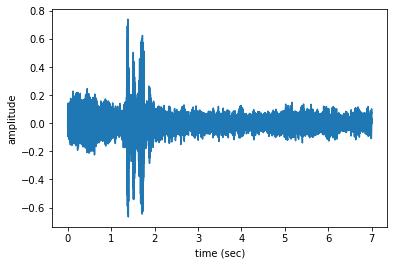

In [ ]:
n=31
fs = None # Sampling frequency
x, fs = librosa.load(files[n],sr=fs)
t = np.arange(len(x))/fs
plt.plot(t,x)
plt.xlabel('time (sec)')
plt.ylabel('amplitude')
plt.show()
display(ipd.Audio(files[n]))

# 8 Results


## Feature extraction : Picth





In [ ]:
# MLENDLS_df.loc[files[n].split('/')[-1]]

In [ ]:
n=0
x, fs = librosa.load(files[n],sr=fs)
print('This audio signal has', len(x), 'samples')

This audio signal has 355446 samples


In [ ]:
def getPitch(x,fs,winLen=0.02):
  #winLen = 0.02 
  p = winLen*fs
  frame_length = int(2**int(p-1).bit_length())
  hop_length = frame_length//2
  f0, voiced_flag, voiced_probs = librosa.pyin(y=x, fmin=80, fmax=450, sr=fs,
                                                 frame_length=frame_length,hop_length=hop_length)
  return f0,voiced_flag

Let's consider the problem of determining whether the filming spot is indoors or outdoors. Then next cell defines a function that takes a collection of audio files together with a CSV file and creates a NumPy array containing the 4 audio features used as predictors (`X`) and a binary label (`y`) that indicates whether the recording is indoors (`y=1`) or outdoors (`y=0`).

In [ ]:
def getXy(files, labels_file, scale_audio=False, onlySingleDigit=False):
  X,y =[],[]
  for file in tqdm(files):
    try:
      fileID = file.split('/')[-1]
      file_name = file.split('/')[-1]
      yi = labels_file.loc[fileID]['in_out']=='indoor'

      fs = None # if None, fs would be 22050
      x, fs = librosa.load(file,sr=fs)
      if scale_audio: x = x/np.max(np.abs(x))
      f0, voiced_flag = getPitch(x,fs,winLen=0.02)
        
      power = np.sum(x**2)/len(x)
      pitch_mean = np.nanmean(f0) if np.mean(np.isnan(f0))<1 else 0
      pitch_std  = np.nanstd(f0) if np.mean(np.isnan(f0))<1 else 0
      voiced_fr = np.mean(voiced_flag)

      xi = [power,pitch_mean,pitch_std,voiced_fr]
      X.append(xi)
      y.append(yi)
    
    except:
      print(file.split('/')[-1])

  return np.array(X),np.array(y)

Let's apply `getXy` to the subsample and obtain the NumPy predictor array (`X`) and a binary label (`y`). 

In [ ]:
X,y = getXy(files, labels_file=MLENDLS_df, scale_audio=True, onlySingleDigit=True)

  1%|          | 24/2500 [00:40<53:22,  1.29s/it]<ipython-input-55-bde05aae3747>:11: RuntimeWarning: invalid value encountered in true_divide
  if scale_audio: x = x/np.max(np.abs(x))


0033.wav


 88%|████████▊ | 2202/2500 [1:01:01<08:14,  1.66s/it]

2206.wav


100%|██████████| 2500/2500 [1:09:48<00:00,  1.68s/it]


In [ ]:
# X1 = getX(files2, scale_audio=True, onlySingleDigit=True)


In [ ]:
# X,y = X

The next cell shows the shape of `X` and `y` and prints the labels vector `y`:

In [ ]:
print('The shape of X is', X.shape) 
print('The shape of y is', y.shape)
print('The labels vector is', y)


The shape of X is (2498, 4)
The shape of y is (2498,)
The labels vector is [ True False False ... False False False]


In [ ]:
print(' The number of indoor recordings is ', np.count_nonzero(y))
print(' The number of outdoor recordings is ', y.size - np.count_nonzero(y))

## Modeling: Support Vector Machines



In [ ]:
from sklearn import svm
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape



Let's now fit an SVM model and print both the training accuracty and validation accuracy.


In [ ]:
model  = svm.SVC(C=1)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)
# yv_1 = model.predict(X1)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.5331807780320366
Validation  Accuracy 0.5253333333333333
The support vectors are (2363, 4)


In [ ]:
the_file = str('/content/drive/MyDrive/Data1/MLEndLS_1/0010.wav')

In [ ]:
# def predict_io(the_file):
#   return model.predict(the_file)

# predict_io(ipd.Audio(the_file))





Let's normalise the predictors, to see if the performance improves.


In [ ]:
mean = X_train.mean(0)
sd =  X_train.std(0)

X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

model  = svm.SVC(C=1,gamma=2)
model.fit(X_train,y_train)

yt_p = model.predict(X_train)
yv_p = model.predict(X_val)

print('Training Accuracy', np.mean(yt_p==y_train))
print('Validation  Accuracy', np.mean(yv_p==y_val))
print('The support vectors are', model.support_vectors_.shape)

Training Accuracy 0.6836384439359268
Validation  Accuracy 0.5293333333333333
The support vectors are (1582, 4)


# 9 Conclusions

We have obtained a training accuracy of 68% and validation accuracy of 53% which is good. Maybe it could be improved by adding some of the other features in the predictior X. Also, trying other machine learning models may help to improve it.